# <center> **CanineVision**

**Deep Learning Model** that Accurately **Identifies Dog Breeds from Images**, Leveraging Advanced Data Analysis Techniques and **TensorFlow**

<b>

```
PROBLEM STATEMENT: To build a Deep Learning Model which takes the image of a dog and identifies its breed.
DATASET USED: https://www.kaggle.com/c/dog-breed-identification
```

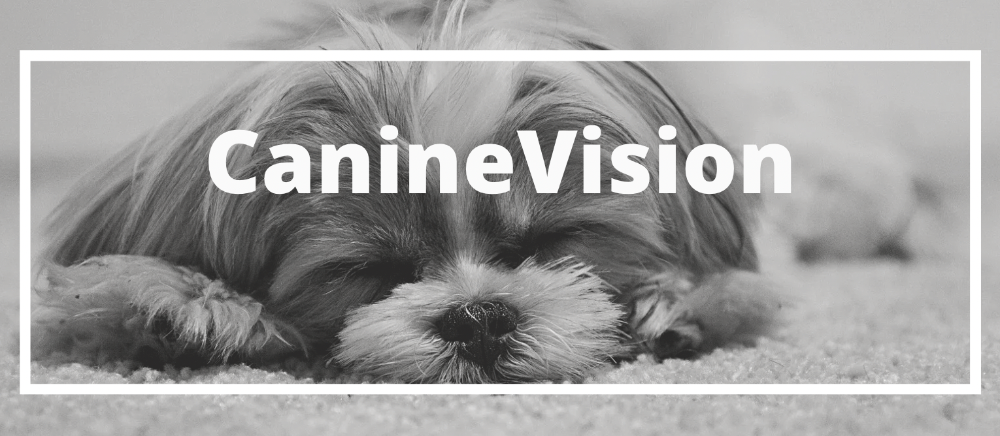

In [5]:
# Importing Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
from google.colab import drive
drive.mount('/content/drive') 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
%cd /content/drive/MyDrive/kaggle_data

/content/drive/MyDrive/kaggle_data


## Download and Unzip

In [5]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/kaggle_data"

In [6]:
!kaggle competitions download -c dog-breed-identification

401 - Unauthorized


In [7]:
# !unzip -q "/content/drive/MyDrive/kaggle_data/dog-breed-identification.zip"

## **End-to-end Multi-class Machine Learning Dog-Breed Classification Model using TensorFlow and TensorFlow Hub**

**Problem**: Identifying the breed of a dog by looking at it.

**Data**: Kaggle (https://www.kaggle.com/competitions/dog-breed-identification/data)

**Evaluation:** Prediction probability

**Features:** 
- The dataset comprises 120 breeds of dogs.
- It is an unstructured dataset (imgaes) so we will use Deep Learning and Transfer learning techniques.
- Above 10,000 images with labels in the training dataset.
- Above 10,000 unlabeled images in the testing dataset.
<br>

---




In [8]:
# Import TensorFlow into Colab

import tensorflow as tf
print("Tensorflow version: ", tf.__version__)

Tensorflow version:  2.11.0


In [9]:
# Import Tensorflow hub
import tensorflow_hub as hub
print("Tensorflow Hub version: ", hub.__version__)

Tensorflow Hub version:  0.13.0


#### **Check for GPU availability**

# Getting the data ready (converting into tensors):
Turn data into tensors (or numerical representations)

In [10]:
labels_csv= pd.read_csv("/content/drive/MyDrive/kaggle_data/labels.csv")

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

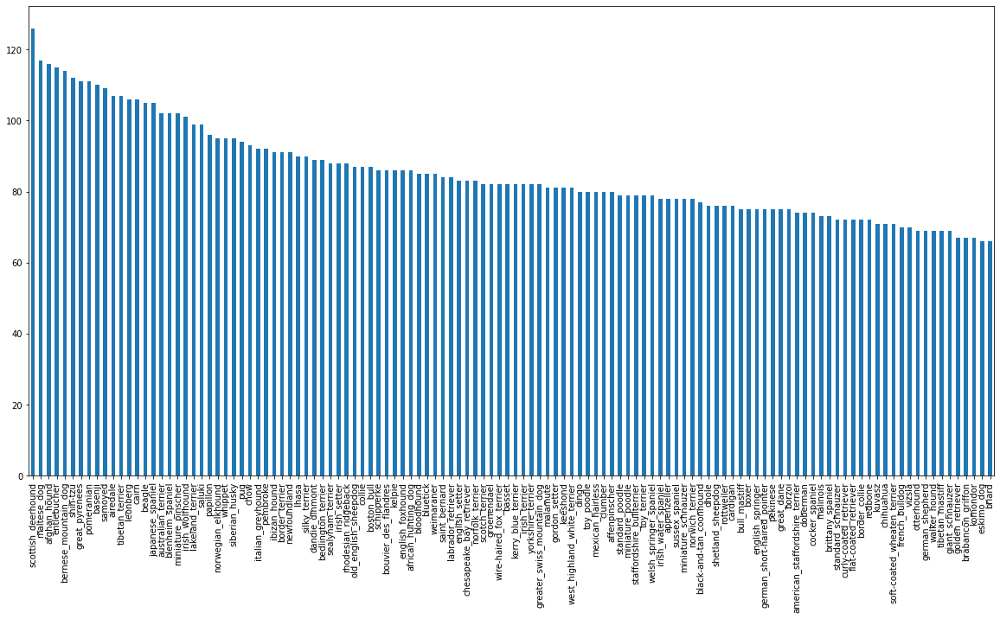

In [13]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [14]:
labels_csv["breed"].value_counts().median()

82.0

### To view an image

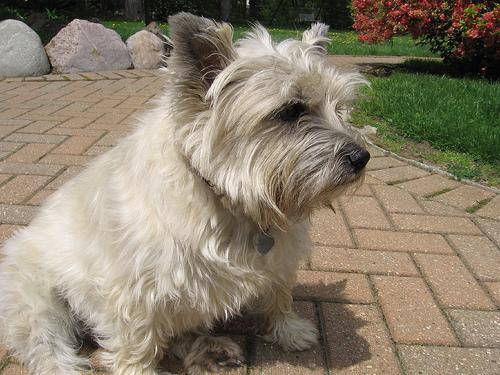

In [15]:
# viewing an image:
from IPython.display import Image
Image("/content/drive/MyDrive/kaggle_data/train/00bee065dcec471f26394855c5c2f3de.jpg")

In [16]:
# Creating a list of all the pathnames from image ids

labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
len(labels_csv)

10222

In [18]:
filenames= ["/content/drive/MyDrive/kaggle_data/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames[2]

'/content/drive/MyDrive/kaggle_data/train/001cdf01b096e06d78e9e5112d419397.jpg'

In [19]:
# Check whether number of dognames is same as actual number of image files
len(filenames)

10222

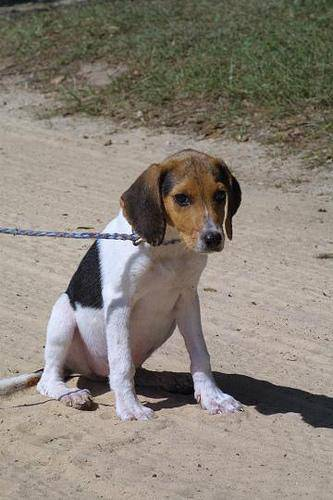

In [20]:
Image(filenames[455])

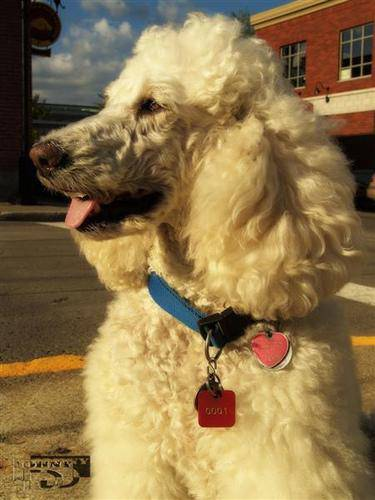

In [21]:
Image(filenames[274])

In [22]:
labels_csv["breed"][294]

'weimaraner'

In [23]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
len(labels)

10222

In [24]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [25]:
unique_breeds= np.unique(labels)
len(unique_breeds)

120

In [26]:
# Turning a unique array values into a unique array of booleans:

boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [28]:
print(labels[0])

boston_bull


### **Creating a Validation Set:**


In [29]:
len(filenames) == len(boolean_labels)

True

In [30]:
X = filenames
y = boolean_labels

In [31]:
X[:3]

['/content/drive/MyDrive/kaggle_data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/kaggle_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/kaggle_data/train/001cdf01b096e06d78e9e5112d419397.jpg']

In [32]:
# Set number of images to use for experimenting:
NUM_IMAGES = 5000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [33]:
from sklearn.model_selection import train_test_split

xtrain, xval, ytrain, yval = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [34]:
xtrain[:2], ytrain[:2]

(['/content/drive/MyDrive/kaggle_data/train/693f4cd00978df07e1283d3da4d02e0c.jpg',
  '/content/drive/MyDrive/kaggle_data/train/7521421e092333c78d6b9dc2e189e659.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fals

**TENSORS**

In [35]:
from matplotlib.pyplot import imread
image = imread(filenames[32])
image.shape

(375, 500, 3)

In [36]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 0, 18,  5],
        [ 2, 22, 10],
        [72, 92, 80],
        ...,
        [ 1, 12,  4],
        [ 3, 14,  6],
        [ 5, 16,  8]],

       [[45, 65, 53],
        [ 0,  7,  0],
        [ 0, 13,  1],
        ...,
        [ 3, 14,  6],
        [ 4, 15,  7],
        [ 6, 17,  9]]], dtype=uint8)>

In [37]:
IMG_SIZE = 224

#FUNCTION FOR CHANGING IMAGES INTO TENSORS:
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### **TURNING DATA INTO BATCHES**
If we will try to process 10000+ images in one go, they might not fit into memory... for this reason, we use the concept of batch size (not more than 32).

**In order to use TensorFlow effectively, data should be in the form of tensor tuples:**
`(image, label)`

In [38]:
# Creating a simple function to return a tuple (image, label)

In [39]:
def get_image_label(image_path, label):
  image=process_image(image_path)
  return image, label


In [40]:
process_image(X[44], tf.constant(y[44]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.33140624, 0.33924937, 0.25689644],
        [0.4096647 , 0.41358626, 0.342998  ],
        [0.43735576, 0.4409622 , 0.38123253],
        ...,
        [0.8859506 , 0.8859506 , 0.8859506 ],
        [0.8756915 , 0.86784834, 0.87961304],
        [0.847015  , 0.8391719 , 0.8509366 ]],

       [[0.3521279 , 0.35710865, 0.2833429 ],
        [0.40803257, 0.41195413, 0.34709066],
        [0.4532748 , 0.45688123, 0.40260953],
        ...,
        [0.8772584 , 0.8772584 , 0.8772584 ],
        [0.86699927, 0.85915613, 0.87092084],
        [0.8383228 , 0.8304797 , 0.8422444 ]],

       [[0.39051124, 0.3944328 , 0.32554272],
        [0.42637193, 0.4302935 , 0.36924654],
        [0.4804272 , 0.4832528 , 0.43067926],
        ...,
        [0.8704376 , 0.8704376 , 0.8704376 ],
        [0.859515  , 0.8516719 , 0.8634366 ],
        [0.8290179 , 0.82117474, 0.83293945]],

       ...,

       [[0.5583288 , 0.57127315, 0.52629495],
        [0.15

In [41]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [42]:
train_data = create_data_batches(xtrain, ytrain)
val_data=create_data_batches(xval, yval, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [43]:
# Check out different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

VISUALIZING DATA BATCHES:


In [44]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    # create subplots
    ax=plt.subplot(5,5,i+1)
    # display images
    plt.imshow(images[i])
    # add image label as title
    plt.title(unique_breeds[labels[i].argmax()])

In [45]:
#train_images, train_labels = next(train_data.as_numpy_iterator())

In [46]:
# Now let's visualize our validation set
# val_images, val_labels = next(val_data.as_numpy_iterator())
# show_25_images(val_images, val_labels)

BUILDING A MODEL

Before we build a model, there are a few things we need to define:

- The input shape (our images shape, in the form of Tensors) to our model.
- The output shape (image labels, in the form of Tensors) of our model.
- The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

- Takes the input shape, output shape and the model we've chosen as parameters.
- Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
- Compiles the model (says it should be evaluated and improved).
- Builds the model (tells the model the input shape it'll be getting).
- Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [48]:

from tensorflow import keras
from tensorflow.keras import layers
IMG_SIZE

224

In [49]:
from tensorflow.keras.optimizers.legacy import Adam
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [50]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### **CREATING CALLBACKS:**
**Callbacks** are helper functions a model can use during training to do such things as save its progress, check its process, or stop training early if a model stops improving.


We will create 2 callbacks:
- one for TensorBoard which helps track our models progress and another fro early stopping which prevents our model from training for too long.

### **TensorBoard Callback:**
To set up a TensorBoard callback, we need to do 3 things:
1. Load the tensorboard notebook extension.
2. Create a tensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function

In [51]:
# Load Tensorflow notebook extension:
%load_ext tensorboard


In [52]:
import datetime
#Create a function to build a tensorboard callback:
def create_tensorboard_callback():
  # Creating a logs directory to store tensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/kaggle_data/logs", 
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)



### **Early Stopping callback:**




In [53]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training our model
- our first model is only going to train on a subset of data (1000 images), to make sure everything is working

In [54]:
NUM_EPOCHS=37 #@param{type:"slider", min:10, max:100, steps:10}

In [55]:
# Check to make sure GPU is working:
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available")

GPU available!


Let's create a function which trains a model.

- Create a model using `create_model()`
- Setup a TensorBoard callback using `create_tensorboard_callback()`
- Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
- Return the model

In [56]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [57]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/37
125/125 [==============================] - 597s 5s/step - loss: 2.1899 - accuracy: 0.5110 - val_loss: 0.9074 - val_accuracy: 0.7440
Epoch 2/37
125/125 [==============================] - 18s 140ms/step - loss: 0.4712 - accuracy: 0.8867 - val_loss: 0.7453 - val_accuracy: 0.7760
Epoch 3/37
125/125 [==============================] - 17s 139ms/step - loss: 0.2419 - accuracy: 0.9513 - val_loss: 0.7164 - val_accuracy: 0.7870
Epoch 4/37
125/125 [==============================] - 17s 139ms/step - loss: 0.1415 - accuracy: 0.9812 - val_loss: 0.7021 - val_accuracy: 0.7820
Epoch 5/37
125/125 [==============================] - 15s 120ms/step - loss: 0.0945 - accuracy: 0.9915 - val_loss: 0.6876 - val_accuracy: 0.7920
Epoch 6/37
125/125 [==============================] - 15s 120ms/step - loss: 0.0664 - accuracy: 0.9975 - val_loss: 0.6876 - val_accuracy: 0.7920
Epoch 7/37
125/125 [===================

 **Looks like our model is overfitted as it is performing way better in training dataset than validation dataset.**

### Checking the TensorBoard logs:
- The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [58]:
%tensorboard --logdir /content/drive/MyDrive/kaggle_data/logs

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [59]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

32/32 [==============================] - 4s 112ms/step


array([[2.2145377e-06, 1.7025704e-07, 6.6073636e-07, ..., 8.8731340e-06,
        6.0565657e-05, 5.5206908e-07],
       [6.1482155e-05, 3.5188496e-06, 9.7805952e-08, ..., 2.0485803e-08,
        1.0774330e-06, 1.0100390e-06],
       [2.9908813e-04, 1.2106504e-05, 1.6776085e-04, ..., 6.1826278e-05,
        4.4078054e-04, 1.7817503e-01],
       ...,
       [9.2494972e-08, 8.0308587e-07, 7.3718081e-07, ..., 4.0271740e-07,
        5.3668936e-04, 4.6967673e-07],
       [5.5157056e-04, 3.9160557e-05, 6.9449502e-06, ..., 3.3553351e-05,
        3.9468021e-03, 9.0450357e-04],
       [4.3928098e-06, 1.0623521e-03, 1.5249908e-06, ..., 2.5562915e-06,
        8.9498690e-06, 1.6095191e-05]], dtype=float32)

In [61]:
# prediction at index 66

index=66
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.41830552e-04 1.78834409e-06 4.70657949e-04 5.22471009e-06
 2.39073206e-03 6.63963920e-06 8.20804562e-04 7.30691609e-05
 1.19729575e-05 2.54793349e-06 1.57813440e-04 1.01450735e-06
 1.17453892e-05 1.14829459e-06 4.40845452e-06 2.03215473e-06
 2.00724821e-06 1.41371265e-05 4.79957578e-07 3.04488116e-03
 3.33950411e-05 1.09290420e-04 8.07040604e-04 9.49224632e-05
 3.40786158e-07 4.31470871e-05 1.52529334e-04 1.23725147e-06
 1.24344388e-06 1.05600450e-02 6.89620310e-06 9.71730606e-06
 2.37757604e-07 7.25809559e-06 6.30496879e-06 2.61356990e-06
 1.26785080e-05 8.47770789e-05 1.88641250e-04 1.74738034e-06
 3.21911273e-07 4.63826154e-06 4.53677245e-07 8.50702963e-06
 1.53160045e-06 3.26394662e-03 1.36567487e-05 5.01535305e-06
 3.44212322e-06 6.19602588e-07 1.35213168e-06 5.41230074e-05
 5.60025967e-07 3.81274585e-05 1.91869094e-05 1.99389132e-03
 1.48253548e-06 1.30150351e-04 7.68680911e-06 1.52738937e-06
 6.13511715e-04 2.27874971e-05 1.73005770e-04 2.27062119e-05
 7.13391182e-06 1.034067

In [62]:
unique_breeds[74]

'mexican_hairless'

<b> Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as confidence levels.

In [63]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'welsh_springer_spaniel'

In [64]:
'''
Now since our validation data is still in a batch dataset, 
we'll have to unbatchify it to make predictions on the validation images 
and then compare those predictions to the validation labels (truth labels).
'''

val_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.08661207, 0.09751292, 0.07815619],
         [0.06751302, 0.0918505 , 0.05747823],
         [0.0604112 , 0.09729353, 0.04384629],
         ...,
         [0.83837754, 0.8455904 , 0.79945946],
         [0.7929071 , 0.7970798 , 0.7295842 ],
         [0.8214812 , 0.826038  , 0.75354415]],
 
        [[0.07184874, 0.09509204, 0.08496422],
         [0.06569613, 0.096114  , 0.0656529 ],
         [0.04666601, 0.09603959, 0.03923428],
         ...,
         [0.74699265, 0.75564605, 0.6929895 ],
         [0.72310936, 0.73635286, 0.6507261 ],
         [0.75028026, 0.76419234, 0.67546123]],
 
        [[0.04185049, 0.07891282, 0.07907913],
         [0.03230042, 0.08288307, 0.05734802],
         [0.02757026, 0.09470031, 0.03129049],
         ...,
         [0.65601474, 0.67997307, 0.56799006],
         [0.6598779 , 0.6838362 , 0.57188773],
         [0.68698364, 0.710942  , 0.5989934 ]],
 
        ...,
 
        [[0.326806  , 0.42850253, 0.3172997 ],
         [0.6370607 , 0.7247883 , 0.66578

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
- Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
- Convert the prediction probabilities to a predicted label.
- Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  # plt.xticks([])
  # plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("Actual Breed= {} \n Model's prediction= {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

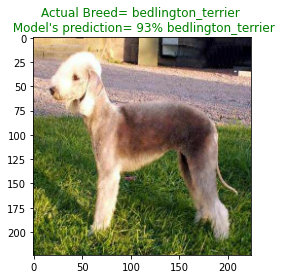

In [67]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=45)

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

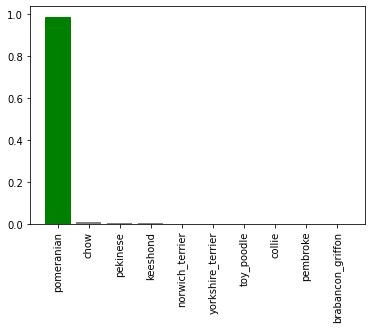

In [69]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=50)


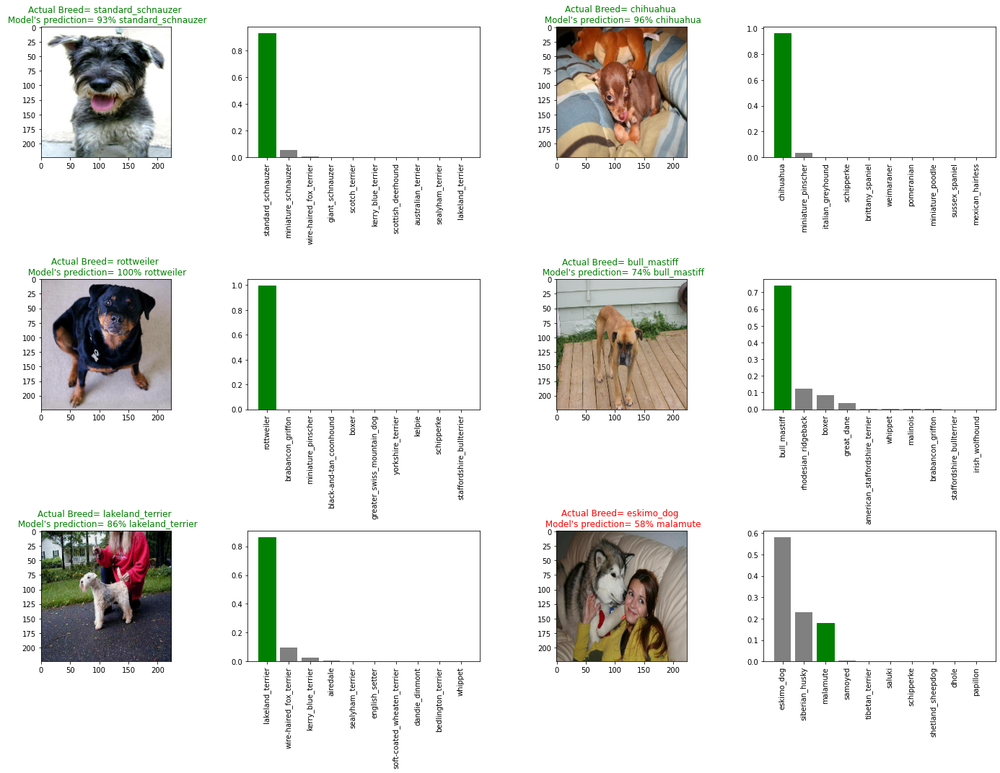

In [70]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()



Saving and reloading a trained model

In [71]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [73]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230317-13491679060949-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230317-13491679060949-1000-images-mobilenetv2-Adam.h5'